<a href="https://colab.research.google.com/github/Abhijeet96-cyber/PythonProgramming/blob/master/CCR_Turbine.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
import plotly.graph_objects as go
from sklearn.preprocessing import MinMaxScaler
from keras.layers import Input, LSTM, RepeatVector, TimeDistributed, Dense
from keras.models import Model
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
!pip install tensorflow


In [10]:
!pip install xlrd
!pip install openpyxl

In [11]:
df = pd.read_excel('shalin1.xlsx')
df

,Unnamed: 0,Time,Turbine RPM,ccruvi5135.pv,ccruvi5136.pv,ccruvi5137.pv,ccruvi5138.pv,ccruvi5139.pv,ccruvi5141.pv,ccruvi5142.pv,ccruvi5143.pv,ccruvi5144.pv,ccruvi5145.pv,ccruvi5146.pv,ccruvi5147.pv,ccruvi5148.pv,ccruvi5149.pv,ccruvi5150.pv,ccruti5135.pv,ccruti5136.pv,ccruti5137.pv,ccruti5138.pv,ccruti5139.pv,ccruti5140.pv,ccruti5141.pv,ccruti5142.pv,ccrupdi5161.pv,ccrufi5106.pv,ccrupi5105.pv,ccrufi5104.pv
0,76420,15-AUG-20 16:00:00.0,57.439320,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,27.615385,27.774359,30.394873,28.497437,22.938461,23.666666,27.846153,0.029986,0.000000,4.092734,0.000000
1,76421,15-AUG-20 16:06:00.0,57.765625,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,27.615385,27.774359,30.394873,28.497437,22.938461,23.666666,27.846153,0.029986,0.000000,4.096040,0.000000
2,76425,15-AUG-20 16:30:00.0,57.626110,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,29.215790,27.446154,27.794872,30.415384,28.261538,22.964102,23.666666,27.887180,0.029986,0.000000,4.101670,0.000000
3,76418,15-AUG-20 15:48:00.0,57.299805,0.070284,0.054229,0.058591,0.066867,-0.075411,0.186585,0.192194,0.362284,0.258213,0.262174,0.228004,0.225546,0.172822,0.068193,0.079538,29.389473,27.574360,27.794872,30.415384,28.517948,22.964102,23.707693,27.866667,0.029986,0.000000,4.093706,0.000000
4,74250,06-AUG-20 15:00:00.0,57.378490,0.321490,0.328037,1.768733,1.384946,-0.127734,0.272090,0.286022,0.661299,0.359533,0.437992,0.329363,0.349258,0.121569,0.093722,0.087108,32.794739,28.530510,27.558975,30.100258,29.557896,22.536863,24.505262,27.461538,0.029385,0.000000,5.654916,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87163,87044,28-SEP-20 22:24:00.0,3447.883301,5.630832,4.672692,7.383081,9.093166,0.006461,2.468154,2.537816,0.396243,7.658906,16.828466,10.078132,7.790453,4.839501,-0.159969,-0.128349,66.390770,55.898460,72.830528,63.035896,49.769230,61.768948,42.733334,44.611282,0.573227,1249.847046,4.570403,80666.195312
87164,87037,28-SEP-20 21:42:00.0,3450.083496,5.608565,4.662916,7.272495,8.981636,-0.164214,2.429782,2.540371,0.397634,7.654243,16.654203,10.040686,7.743820,4.822843,-0.161418,-0.131945,66.961067,56.524635,72.898964,63.097435,49.842041,61.847122,42.753845,44.625641,0.572781,1255.114136,4.573050,80888.390625
87165,87009,28-SEP-20 18:54:00.0,3446.816406,5.624682,4.642255,6.958440,8.732988,-0.053652,2.415977,2.539795,0.391265,7.651387,16.807997,10.071990,7.832694,4.784053,-0.154792,-0.118144,66.501572,57.095757,73.144577,63.347729,50.079967,61.979588,42.896446,44.793880,0.574507,1239.481812,4.570951,81237.359375
87166,44788,05-APR-20 20:48:00.0,3536.987061,4.010717,5.412465,7.975109,5.898041,-0.082872,2.503365,2.544320,0.058939,7.671556,5.370571,3.282521,9.442617,10.609122,-0.141624,-0.106927,71.593208,59.593555,73.135345,63.670555,52.214516,61.142452,44.248245,44.476925,0.799709,1207.525879,5.285191,98805.109375


In [12]:
df['Time'] = pd.to_datetime(df['Time'])
#from dateutil import parser
#for i in range(len(df['Time'])):
#    df['Time'][i] = parser.parse(df['Time'][i])

In [13]:
df.set_index(['Time'], inplace=True)

In [14]:
df.head()

,Unnamed: 0,Turbine RPM,ccruvi5135.pv,ccruvi5136.pv,ccruvi5137.pv,ccruvi5138.pv,ccruvi5139.pv,ccruvi5141.pv,ccruvi5142.pv,ccruvi5143.pv,ccruvi5144.pv,ccruvi5145.pv,ccruvi5146.pv,ccruvi5147.pv,ccruvi5148.pv,ccruvi5149.pv,ccruvi5150.pv,ccruti5135.pv,ccruti5136.pv,ccruti5137.pv,ccruti5138.pv,ccruti5139.pv,ccruti5140.pv,ccruti5141.pv,ccruti5142.pv,ccrupdi5161.pv,ccrufi5106.pv,ccrupi5105.pv,ccrufi5104.pv
Time,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-08-15 16:00:00,76420,57.439320,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,27.615385,27.774359,30.394873,28.497437,22.938461,23.666666,27.846153,0.029986,0.0,4.092734,0.0
2020-08-15 16:06:00,76421,57.765625,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,27.615385,27.774359,30.394873,28.497437,22.938461,23.666666,27.846153,0.029986,0.0,4.096040,0.0
2020-08-15 16:30:00,76425,57.626110,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,29.215790,27.446154,27.794872,30.415384,28.261538,22.964102,23.666666,27.887180,0.029986,0.0,4.101670,0.0
2020-08-15 15:48:00,76418,57.299805,0.070284,0.054229,0.058591,0.066867,-0.075411,0.186585,0.192194,0.362284,0.258213,0.262174,0.228004,0.225546,0.172822,0.068193,0.079538,29.389473,27.574360,27.794872,30.415384,28.517948,22.964102,23.707693,27.866667,0.029986,0.0,4.093706,0.0
2020-08-06 15:00:00,74250,57.378490,0.321490,0.328037,1.768733,1.384946,-0.127734,0.272090,0.286022,0.661299,0.359533,0.437992,0.329363,0.349258,0.121569,0.093722,0.087108,32.794739,28.530510,27.558975,30.100258,29.557896,22.536863,24.505262,27.461538,0.029385,0.0,5.654916,0.0


In [15]:
df.sort_index(inplace=True)
df.drop(['Unnamed: 0'], axis=1, inplace=True)
df.shape


(87168, 28)

In [16]:
df.head()

,Turbine RPM,ccruvi5135.pv,ccruvi5136.pv,ccruvi5137.pv,ccruvi5138.pv,ccruvi5139.pv,ccruvi5141.pv,ccruvi5142.pv,ccruvi5143.pv,ccruvi5144.pv,ccruvi5145.pv,ccruvi5146.pv,ccruvi5147.pv,ccruvi5148.pv,ccruvi5149.pv,ccruvi5150.pv,ccruti5135.pv,ccruti5136.pv,ccruti5137.pv,ccruti5138.pv,ccruti5139.pv,ccruti5140.pv,ccruti5141.pv,ccruti5142.pv,ccrupdi5161.pv,ccrufi5106.pv,ccrupi5105.pv,ccrufi5104.pv
Time,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2019-10-02 06:00:00,3543.136719,3.911049,4.723828,7.969944,7.615287,-0.020337,4.033437,3.391959,3.347474,0.185386,4.486025,4.487423,7.534036,10.166168,-0.054675,-0.059310,75.172501,70.027603,75.355209,68.613106,58.798847,70.203972,48.876610,48.094738,1.727703,1178.635742,5.264220,64149.660156
2019-10-02 06:06:00,3544.476807,3.949725,4.860366,7.852082,7.630008,-0.160140,4.060051,3.398482,3.344542,0.182766,4.534853,4.494500,7.547764,10.250349,-0.058423,-0.043735,74.947685,69.965523,75.369873,68.649719,58.890133,70.168419,48.936844,48.157894,1.706194,1187.733154,5.246032,65054.250000
2019-10-02 06:12:00,3543.571533,3.907303,4.744481,7.880648,7.545193,-0.164798,4.022760,3.393842,3.340213,0.183689,4.543969,4.465163,7.541646,10.219775,-0.043008,-0.050578,74.177231,69.899429,75.349411,68.607307,58.684666,70.168419,48.840065,48.061115,1.717775,1185.068115,5.240321,65464.527344
2019-10-02 06:18:00,3543.282471,3.890369,4.752323,7.920780,7.568025,-0.052383,4.047554,3.423739,3.346648,0.186152,4.562201,4.509583,7.572590,10.211614,-0.055514,-0.039157,74.467705,69.927063,75.340355,68.591820,58.764801,70.181290,48.853806,48.061848,1.732947,1187.876587,5.244233,65993.328125
2019-10-02 06:24:00,3541.512451,3.898803,4.754655,7.921942,7.578385,-0.080214,4.036666,3.390963,3.347604,0.186152,4.481540,4.516224,7.498123,10.077785,-0.040345,-0.055457,74.594734,69.927086,75.371391,68.629288,58.674030,70.204117,48.868420,48.094738,1.710894,1183.343506,5.242986,65361.773438


In [17]:
figure = go.Figure()
figure.add_trace(go.Scatter(x=df.index,  y=df['Turbine RPM']))
figure.show()

In [18]:
df

,Turbine RPM,ccruvi5135.pv,ccruvi5136.pv,ccruvi5137.pv,ccruvi5138.pv,ccruvi5139.pv,ccruvi5141.pv,ccruvi5142.pv,ccruvi5143.pv,ccruvi5144.pv,ccruvi5145.pv,ccruvi5146.pv,ccruvi5147.pv,ccruvi5148.pv,ccruvi5149.pv,ccruvi5150.pv,ccruti5135.pv,ccruti5136.pv,ccruti5137.pv,ccruti5138.pv,ccruti5139.pv,ccruti5140.pv,ccruti5141.pv,ccruti5142.pv,ccrupdi5161.pv,ccrufi5106.pv,ccrupi5105.pv,ccrufi5104.pv
Time,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2019-10-02 06:00:00,3543.136719,3.911049,4.723828,7.969944,7.615287,-0.020337,4.033437,3.391959,3.347474,0.185386,4.486025,4.487423,7.534036,10.166168,-0.054675,-0.059310,75.172501,70.027603,75.355209,68.613106,58.798847,70.203972,48.876610,48.094738,1.727703,1178.635742,5.264220,64149.660156
2019-10-02 06:06:00,3544.476807,3.949725,4.860366,7.852082,7.630008,-0.160140,4.060051,3.398482,3.344542,0.182766,4.534853,4.494500,7.547764,10.250349,-0.058423,-0.043735,74.947685,69.965523,75.369873,68.649719,58.890133,70.168419,48.936844,48.157894,1.706194,1187.733154,5.246032,65054.250000
2019-10-02 06:12:00,3543.571533,3.907303,4.744481,7.880648,7.545193,-0.164798,4.022760,3.393842,3.340213,0.183689,4.543969,4.465163,7.541646,10.219775,-0.043008,-0.050578,74.177231,69.899429,75.349411,68.607307,58.684666,70.168419,48.840065,48.061115,1.717775,1185.068115,5.240321,65464.527344
2019-10-02 06:18:00,3543.282471,3.890369,4.752323,7.920780,7.568025,-0.052383,4.047554,3.423739,3.346648,0.186152,4.562201,4.509583,7.572590,10.211614,-0.055514,-0.039157,74.467705,69.927063,75.340355,68.591820,58.764801,70.181290,48.853806,48.061848,1.732947,1187.876587,5.244233,65993.328125
2019-10-02 06:24:00,3541.512451,3.898803,4.754655,7.921942,7.578385,-0.080214,4.036666,3.390963,3.347604,0.186152,4.481540,4.516224,7.498123,10.077785,-0.040345,-0.055457,74.594734,69.927086,75.371391,68.629288,58.674030,70.204117,48.868420,48.094738,1.710894,1183.343506,5.242986,65361.773438
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-10-01 05:30:00,3452.363281,5.584534,4.681018,7.232809,9.072908,-0.061459,2.552088,2.561890,0.454115,7.656788,17.285593,10.062336,7.518452,5.054880,-0.153210,-0.105585,65.875046,54.390617,72.094734,62.115791,48.894737,61.586853,41.872540,43.797707,0.574456,1223.772949,4.762930,72559.609375
2020-10-01 05:36:00,3453.702393,5.568340,4.690503,7.217552,9.065088,-0.120579,2.554045,2.561448,0.452829,7.653196,17.327570,10.094911,7.610501,5.025988,-0.152718,-0.095359,65.889473,54.419930,72.106689,62.156773,48.909405,61.176998,41.900002,43.831577,0.586856,1227.029541,4.767155,72422.796875
2020-10-01 05:42:00,3452.198242,5.578866,4.659598,6.969697,8.853523,-0.005016,2.535235,2.549738,0.451176,7.661634,17.251120,10.080060,7.555950,5.069897,-0.152615,-0.102551,65.946259,54.405262,72.127426,62.123756,48.909420,61.135391,41.885319,43.810528,0.584237,1225.198975,4.774227,72128.843750


In [19]:
figure = go.Figure()
for i in range(1,10):
    figure.add_trace(go.Scatter(x=df.index[5000:10000],  y=df[df.columns[i]][5000:10000], name = df.columns[i]))
figure.show()

In [20]:
train = pd.concat([df['08-OCT-2019': '01-NOV-2019'], df['18-NOV-2019': '31-JAN-2020'], df['10-FEB-2020':'20-FEB-2020'], df['03-MAR-2020' : '20-MAR-2020'],df['01-APR-2020':'30-JUN-2020']])
test = pd.concat([df['02-NOV-2019':'17-NOV-2020'], df['01-FEB-2020':'09-FEB-2020'], df['21-FEB-2020':'02-MAR-2020'], df['21-MAR-2020':'30-MAR-2020'],df['01-JUL-2020':'20-JUL-2020']])
#test = df['02-NOV-2019':'17-NOV-2020']
print(train.shape,'\n', test.shape)

(52800, 28) 
 (91788, 28)


In [21]:
#df_test = df[df['Turbine RPM']<1500]
#df_test.shape

In [22]:
scaler=MinMaxScaler()
x_train = scaler.fit_transform(train)
x_test = scaler.transform(test)
x_train.shape

(52800, 28)

In [23]:
# Reshape input for LSTM
x_train = x_train.reshape(x_train.shape[0],1,x_train.shape[1])
x_test = x_test.reshape(x_test.shape[0],1,x_test.shape[1])

In [26]:
def autoencoder_model(X):
    inputs = Input(shape=(X.shape[1], X.shape[2]))
    L1 = LSTM(16, activation='relu', return_sequences=True)(inputs)#, kernel_regularizer=regularizers.l2(0.00))(inputs)
    L2 = LSTM(4, activation='relu', return_sequences=False)(L1)
    L3 = RepeatVector(X.shape[1])(L2)
    L4 = LSTM(4, activation='relu', return_sequences=True)(L3)
    L5 = LSTM(16, activation='relu', return_sequences=True)(L4)
    output = TimeDistributed(Dense(X.shape[2]))(L5)
    model = Model(inputs = inputs, outputs = output)
    return model

In [27]:
model = autoencoder_model(x_train)
model.compile(optimizer='adam', loss='mae')
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 1, 28)]           0         
_________________________________________________________________
lstm (LSTM)                  (None, 1, 16)             2880      
_________________________________________________________________
lstm_1 (LSTM)                (None, 4)                 336       
_________________________________________________________________
repeat_vector (RepeatVector) (None, 1, 4)              0         
_________________________________________________________________
lstm_2 (LSTM)                (None, 1, 4)              144       
_________________________________________________________________
lstm_3 (LSTM)                (None, 1, 16)             1344      
_________________________________________________________________
time_distributed (TimeDistri (None, 1, 28)             476   

In [28]:
history = model.fit(x_train, x_train, epochs=50, batch_size=10, validation_split=0.05).history

Epoch 1/50
5016/5016 [==============================] - 20s 3ms/step - loss: 0.1125 - val_loss: 0.0678
Epoch 2/50
5016/5016 [==============================] - 16s 3ms/step - loss: 0.0624 - val_loss: 0.0615
Epoch 3/50
5016/5016 [==============================] - 16s 3ms/step - loss: 0.0600 - val_loss: 0.0527
Epoch 4/50
5016/5016 [==============================] - 16s 3ms/step - loss: 0.0531 - val_loss: 0.0539
Epoch 5/50
5016/5016 [==============================] - 16s 3ms/step - loss: 0.0501 - val_loss: 0.0415
Epoch 6/50
5016/5016 [==============================] - 16s 3ms/step - loss: 0.0478 - val_loss: 0.0412
Epoch 7/50
5016/5016 [==============================] - 15s 3ms/step - loss: 0.0469 - val_loss: 0.0417
Epoch 8/50
5016/5016 [==============================] - 16s 3ms/step - loss: 0.0464 - val_loss: 0.0433
Epoch 9/50
5016/5016 [==============================] - 16s 3ms/step - loss: 0.0461 - val_loss: 0.0438
Epoch 10/50
5016/5016 [==============================] - 16s 3ms/step - l

In [31]:
model.save('CCRTurbineTrain1.xlsx')

INFO:tensorflow:Assets written to: CCRTurbineTrain1.xlsx/assets


In [30]:
figure = go.Figure()

figure.add_trace(go.Scatter(y=history['loss'], name = 'Train'))
figure.add_trace(go.Scatter(y=history['val_loss'], name = 'Validation'))
figure.update_layout(showlegend=True, title='Loss')
figure.show()

(52800, 1, 28)


/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



(0.0, 0.3)

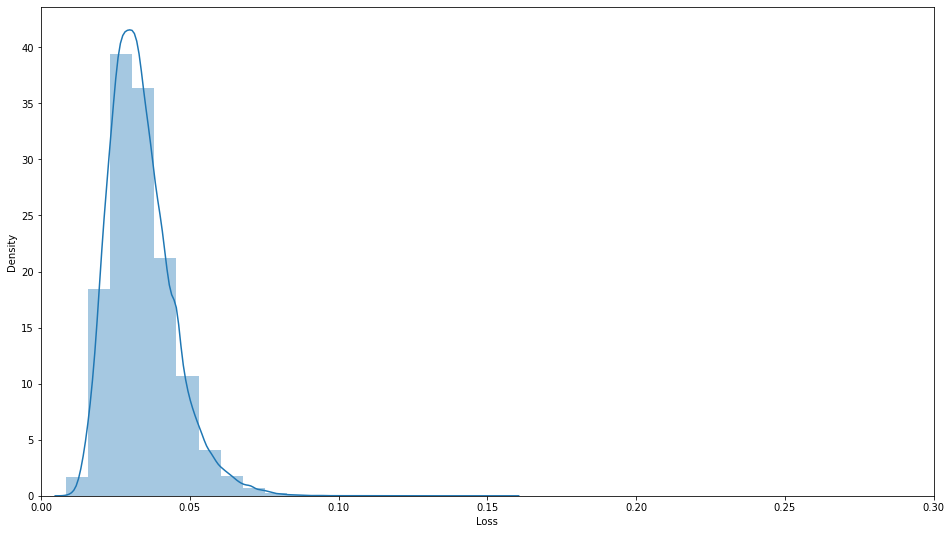

In [32]:
#Plot the loss distribution of training set to set a threshold 


x_pred =  model.predict(x_train)
print(x_pred.shape)
x_pred = x_pred.reshape(x_pred.shape[0], x_pred.shape[2])
x_pred = pd.DataFrame(x_pred, columns=train.columns)
x_pred.index = train.index

scored = pd.DataFrame(index = train.index)
xtrain = x_train.reshape(x_train.shape[0], x_train.shape[2])
scored['Loss'] = np.mean(np.abs(x_pred-xtrain), axis=1)

plt.figure(figsize=(16,9))
sns.distplot(scored['Loss'], bins=20, kde=True)
plt.xlim([0.0,0.3])

In [33]:
#calculte the loss on test set

x_pred = model.predict(x_test)
x_pred = x_pred.reshape(x_pred.shape[0], x_pred.shape[2])
x_pred = pd.DataFrame(x_pred, columns=test.columns)
x_pred.index = test.index

scored = pd.DataFrame(index = test.index)
xtest = x_test.reshape(x_test.shape[0], x_test.shape[2])
scored['loss'] = np.mean(np.abs(xtest-x_pred), axis=1)
scored['threshold'] = 0.08
scored['anomaly'] = scored['loss'] > scored['threshold']

In [34]:
x_pred_train = model.predict(x_train)
x_pred_train = x_pred_train.reshape(x_pred_train.shape[0], x_pred_train.shape[2])
x_pred_train = pd.DataFrame(x_pred_train, columns=train.columns)
x_pred_train.index = train.index

scoredtrain = pd.DataFrame(index = train.index)
xtrain = x_train.reshape(x_train.shape[0], x_train.shape[2])
scoredtrain['loss'] = np.mean(np.abs(xtrain-x_pred_train), axis=1)
scoredtrain['threshold'] = 0.08
scoredtrain['anomaly'] = scoredtrain['loss'] > scoredtrain['threshold']
scored = pd.concat([scoredtrain,scored])

In [35]:
scored.head()

,loss,threshold,anomaly
Time,,,
2019-10-08 00:00:00,0.020958,0.08,False
2019-10-08 00:06:00,0.023590,0.08,False
2019-10-08 00:12:00,0.022466,0.08,False
2019-10-08 00:18:00,0.017887,0.08,False
2019-10-08 00:24:00,0.022560,0.08,False


In [36]:
figure = go.Figure()
figure.add_trace(go.Scatter(x=scored.index,  y=scored['loss']))
figure.add_trace(go.Scatter(x=scored.index,  y=scored['threshold']))
figure.show()